# Proyecto Final

Alumno: Luis Raúl Sigala González 

Matrícula: 309183

Asesor: Olanda Prieto Ordaz

Materia: Machine Learning

UACH - Facultad de Ingeniería - Maestría en Ingeniería en Computación

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier
import xgboost as xgb
import seaborn as sns


In [124]:
!pip list


Package                       Version
----------------------------- -----------
absl-py                       2.1.0
alabaster                     0.7.16
altair                        5.4.1
anyio                         4.6.2
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.3.0
astroid                       2.14.2
asttokens                     2.0.5
astunparse                    1.6.3
async-lru                     2.0.4
atomicwrites                  1.4.0
attrs                         24.2.0
autopep8                      2.0.4
Babel                         2.11.0
bcrypt                        3.2.0
beautifulsoup4                4.12.3
binaryornot                   0.4.4
black                         24.8.0
bleach                        4.1.0
blinker                       1.8.2
Bottleneck                    1.4.2
brainflow                     5.10.1
Brotli                        1.0.9
cachetools                    5.5.0
certifi    

In [ ]:
data=np.genfromtxt('señales.csv', delimiter=',')
x=np.delete(data, 1, axis=1)
y=data[:,1]

x_final=[]
y_final=[]
for i in range(0, len(y),2):
    pass
    x_final.append([x[i,1:],x[i+1,1:]])
    y_final.append(y[i])
    
x=np.array(x_final)
x=np.transpose(x_final,(0,2,1))
y=np.array(y_final)

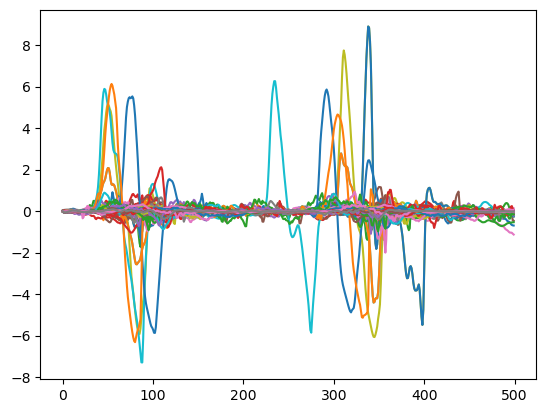

In [126]:
plt.plot(x[:,:,0].T)

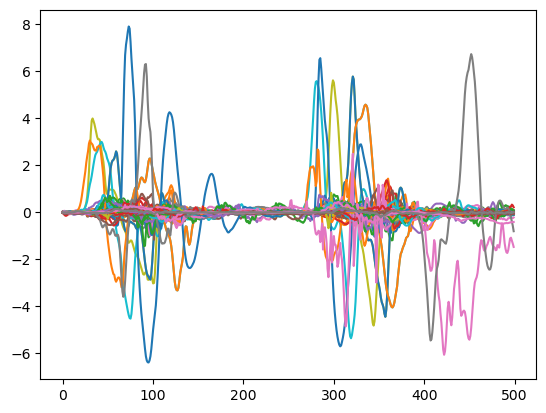

In [127]:
plt.plot(x[:,:,1].T)

In [128]:
df = pd.read_csv('segmentada.csv')

# Mostrar las primeras filas del DataFrame para verificar que se cargó correctamente
print(df.head())

         d8        d5        d7        d0        x8        x5        x7  \
0  0.002534  0.054895  0.041522  0.057841 -0.069561 -0.012329 -0.113641   
1  0.002241  0.082535  0.035515  0.079078 -0.070179  0.005430 -0.088333   
2  0.071195  0.300494  0.111925  0.136287 -0.005589  0.237707 -0.017873   
3  0.151984  0.158136  0.166274  0.125265 -0.033199 -0.153598  0.018912   
4  0.196612  0.089259  0.147832  0.119468 -0.029745  0.032694  0.093026   

         x0        m8        m5  ...        d2        x9      x0.1      x8.1  \
0 -0.021926 -0.069225 -0.042910  ...  0.006265 -0.069161 -0.000391 -0.069902   
1 -0.055264 -0.070389 -0.055693  ...  0.009458 -0.074414  0.006989 -0.087719   
2  0.090340 -0.009867  0.238795  ...  0.210151 -0.002957  0.030859  0.001466   
3 -0.136506 -0.030836 -0.063219  ...  0.078567 -0.054199 -0.039953 -0.008080   
4 -0.027950 -0.083515  0.004362  ...  0.195842 -0.005517  0.007372 -0.048129   

         x2        m9      m0.1      m8.1        m2  target  
0 -0.0

Split Train y test

In [129]:
X_train,X_test,y_train ,y_test=train_test_split(df.drop(columns='target'), df['target'], test_size=0.2, random_state=42, stratify=df['target'])

c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 'accept_sparse={accept_sparse}'."


In [130]:
conteo_clases = y_train.value_counts().to_dict()
print(conteo_clases)
conteo_clases = y_test.value_counts().to_dict()
print(conteo_clases)

{0.0: 42, 1.0: 36}
{0.0: 11, 1.0: 9}


### Clasificación de los datos Y creación de Voting 

In [131]:
pipeline = Pipeline(steps=[
    ('preprocessor', StandardScaler()),
    ('logistic', LogisticRegression())  
])
param_grid = {
    'logistic__C': [0.1, 1, 10, 100],  # Parametro de regularización
    'logistic__solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],  # Optimizador
    'logistic__penalty': ['l2'],
    #'logistic__fit_intercept':[True,False]
}

lr_grid = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy')
# Busqueda de las mejores caracteristicas para el clasificado
lr_grid.fit(X_train, y_train)

c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 'accept_sparse={accept_sparse}'."
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor', StandardScaler()),
                                       ('logistic', LogisticRegression())]),
             param_grid={'logistic__C': [0.1, 1, 10, 100],
                         'logistic__penalty': ['l2'],
                         'logistic__solver': ['lbfgs', 'liblinear', 'newton-cg',
                                              'newton-cholesky', 'sag',
                                              'saga']},
             scoring='accuracy')

In [132]:
pipeline = Pipeline(steps=[
    ('preprocessor', StandardScaler()),
    ('svc', SVC(probability=True))  
])
param_grid = {
    'svc__C': [0.1, 1, 10, 100],               # Regularization parameter
    'svc__kernel': ['linear', 'rbf', 'poly'],   # Type of kernel
    'svc__gamma': ['scale', 'auto'],            # Kernel coefficient for 'rbf', 'poly', and 'sigmoid'
    'svc__degree': [2, 3, 4],                   # Degree of the polynomial kernel function (if 'poly')
    'svc__coef0': [0.0, 0.1, 0.5],              # Independent term in kernel function (for 'poly' and 'sigmoid')
}

svm_grid = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy')
# Busqueda de las mejores caracteristicas para el clasificado
svm_grid.fit(X_train, y_train)

c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 'accept_sparse={accept_sparse}'."
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor', StandardScaler()),
                                       ('svc', SVC(probability=True))]),
             param_grid={'svc__C': [0.1, 1, 10, 100],
                         'svc__coef0': [0.0, 0.1, 0.5],
                         'svc__degree': [2, 3, 4],
                         'svc__gamma': ['scale', 'auto'],
                         'svc__kernel': ['linear', 'rbf', 'poly']},
             scoring='accuracy')

In [133]:


pipeline = Pipeline(steps=[
    ('forest', RandomForestClassifier())  
])

param_grid = {
    'forest__n_estimators': [50, 100, 200], 
    'forest__max_depth': [None, 10, 20, 30], 
    'forest__min_samples_split': [2, 5, 10],  
    'forest__min_samples_leaf': [1, 2, 4],  
    'forest__bootstrap': [True, False] 
}

rf_grid = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy')
rf_grid.fit(X_train, y_train)


c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 'accept_sparse={accept_sparse}'."
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('forest', RandomForestClassifier())]),
             param_grid={'forest__bootstrap': [True, False],
                         'forest__max_depth': [None, 10, 20, 30],
                         'forest__min_samples_leaf': [1, 2, 4],
                         'forest__min_samples_split': [2, 5, 10],
                         'forest__n_estimators': [50, 100, 200]},
             scoring='accuracy')

In [134]:
voting_pipeline = Pipeline([
    ('voting', VotingClassifier(estimators=[
        ('lr', lr_grid.best_estimator_),
        ('svm', svm_grid.best_estimator_),
        ('rf', rf_grid.best_estimator_)
    ], voting='soft'))
])

voting_pipeline.fit(X_train, y_train)

c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 'accept_sparse={accept_sparse}'."
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 

Pipeline(steps=[('voting',
                 VotingClassifier(estimators=[('lr',
                                               Pipeline(steps=[('preprocessor',
                                                                StandardScaler()),
                                                               ('logistic',
                                                                LogisticRegression(C=10,
                                                                                   solver='sag'))])),
                                              ('svm',
                                               Pipeline(steps=[('preprocessor',
                                                                StandardScaler()),
                                                               ('svc',
                                                                SVC(C=10,
                                                                    degree=2,
                                                                    kernel='linear',
                                                                    probability=True))])),
                                              ('rf',
                                               Pipeline(steps=[('forest',
                                                                RandomForestClassifier(max_depth=10,
                                                                                       min_samples_leaf=4,
                                                                                       min_samples_split=10,
                                                                                       n_estimators=50))]))],
                                  voting='soft'))])

### Resultados

LogisticRegression Accuracy: 0.8000

Classification Report:
               precision    recall  f1-score   support

         0.0       0.89      0.73      0.80        11
         1.0       0.73      0.89      0.80         9

    accuracy                           0.80        20
   macro avg       0.81      0.81      0.80        20
weighted avg       0.82      0.80      0.80        20



c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  Whether an array will be forced to be fortran or c-style.
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 'accept_sparse={accept_sparse}'."
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` 

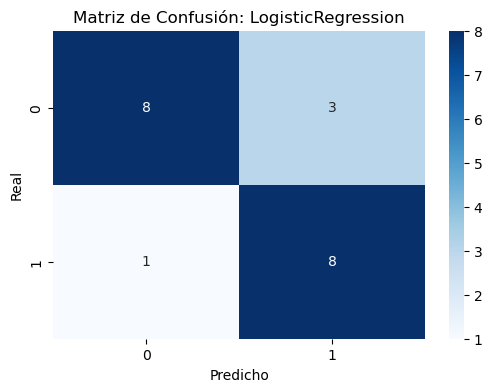

c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  Whether an array will be forced to be fortran or c-style.
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 'accept_sparse={accept_sparse}'."
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` 

SVM Accuracy: 0.8000

Classification Report:
               precision    recall  f1-score   support

         0.0       0.89      0.73      0.80        11
         1.0       0.73      0.89      0.80         9

    accuracy                           0.80        20
   macro avg       0.81      0.81      0.80        20
weighted avg       0.82      0.80      0.80        20



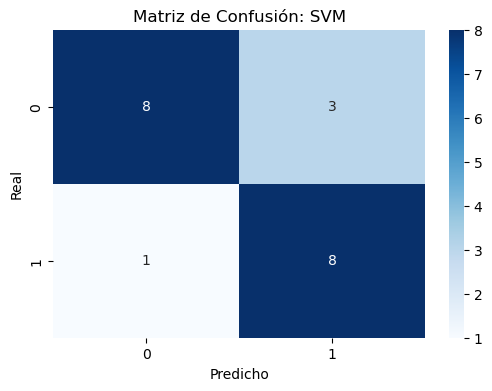

RandomForest Accuracy: 0.6500

Classification Report:
               precision    recall  f1-score   support

         0.0       0.70      0.64      0.67        11
         1.0       0.60      0.67      0.63         9

    accuracy                           0.65        20
   macro avg       0.65      0.65      0.65        20
weighted avg       0.65      0.65      0.65        20



c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  Whether an array will be forced to be fortran or c-style.
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 'accept_sparse={accept_sparse}'."
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` 

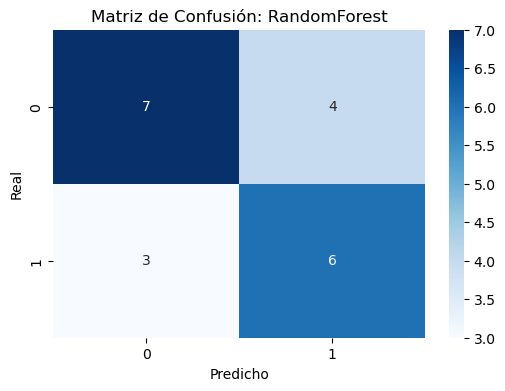

c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  Whether an array will be forced to be fortran or c-style.
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  # ensure correct sparse format
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  f" You provided 'accept_sparse={accept_sparse}'."
c:\Users\sigal\anaconda3\envs\EEG\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` 

Voting Accuracy: 0.8500

Classification Report:
               precision    recall  f1-score   support

         0.0       0.90      0.82      0.86        11
         1.0       0.80      0.89      0.84         9

    accuracy                           0.85        20
   macro avg       0.85      0.85      0.85        20
weighted avg       0.86      0.85      0.85        20



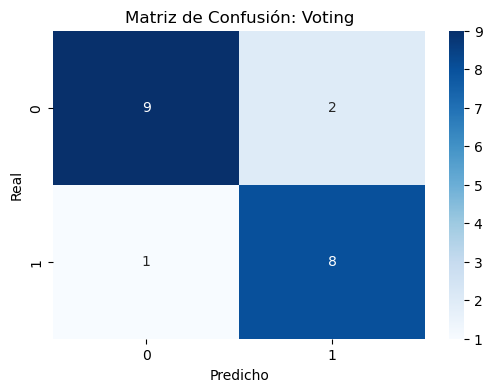

In [ ]:

def plot_confusion_matrix(y_test, y_pred, model_name):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
    plt.title(f'Matriz de Confusión: {model_name}')
    plt.ylabel('Real')
    plt.xlabel('Predicho')
    plt.show()

models = {
    'LogisticRegression': lr_grid.best_estimator_,
    'SVM': svm_grid.best_estimator_,
    'RandomForest': rf_grid.best_estimator_,
    'Voting': voting_pipeline,
}

for name, model in models.items():
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f'{name} Accuracy: {accuracy:.4f}')
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

    
    # Matriz de confusión
    plot_confusion_matrix(y_test, y_pred, name)

In [ ]:
import joblib
joblib.dump(svm_grid.best_estimator_, 'svm_pipeline.pkl')


['rf_pipeline.pkl']

### Conclusión

Los resultados de los modelos propuestos resultan mayores que los mostrados por el estado del arte, proponiendo que todas las propuestas en este documento entregan el resultado esperado. El dataset presentado presenta algunos datos que no pueden ser clasificados correctamente por ninguna de las propuestas, pero se considera que se debe de analizar estos casos por separados en caso de que se tenga un error en su adquisición.

Deploy en Streamlit

https://proyectofinalml-3ki75jxsssripppndrjyii.streamlit.app/